In [1]:
%matplotlib inline
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn import metrics

In [2]:
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [3]:
# Pipeline and transformer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [5]:
# Hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

In [6]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [7]:
df = pd.read_csv("bank_loan_defaulter.csv")

In [8]:
df.head().T

,0,1,2,3,4
ID,65087372,1450153,1969101,6651430,14354669
Loan Amount,10000,3609,28276,11170,16890
Funded Amount,32236,11940,9311,6954,13226
Funded Amount Investor,12329.36286,12191.99692,21603.22455,17877.15585,13539.92667
Term,59,59,59,59,59
Batch Enrolled,BAT2522922,BAT1586599,BAT2136391,BAT2428731,BAT5341619
Interest Rate,11.135007,12.237563,12.545884,16.731201,15.0083
Grade,B,C,F,C,C
Sub Grade,C4,D3,D4,C3,D4
Employment Duration,MORTGAGE,RENT,MORTGAGE,MORTGAGE,MORTGAGE


In [9]:
df.shape

(67463, 35)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            67463 non-null  int64  
 1   Loan Amount                   67463 non-null  int64  
 2   Funded Amount                 67463 non-null  int64  
 3   Funded Amount Investor        67463 non-null  float64
 4   Term                          67463 non-null  int64  
 5   Batch Enrolled                67463 non-null  object 
 6   Interest Rate                 67463 non-null  float64
 7   Grade                         67463 non-null  object 
 8   Sub Grade                     67463 non-null  object 
 9   Employment Duration           67463 non-null  object 
 10  Home Ownership                67463 non-null  float64
 11  Verification Status           67463 non-null  object 
 12  Payment Plan                  67463 non-null  object 
 13  L

#### There are 67463 entries and 35 columns in this dataset. Most of the features are numeric and 9 of them are objects.

In [11]:
len(df[df.duplicated()])

0

In [12]:
dfc = df

In [13]:
dfc = dfc.drop('ID', axis = 1)

In [14]:
dfc.shape

(67463, 34)

In [15]:
len(dfc[dfc.duplicated()])

0

In [16]:
dfc.isnull().sum()/dfc.shape[0]*100

Loan Amount                     0.0
Funded Amount                   0.0
Funded Amount Investor          0.0
Term                            0.0
Batch Enrolled                  0.0
Interest Rate                   0.0
Grade                           0.0
Sub Grade                       0.0
Employment Duration             0.0
Home Ownership                  0.0
Verification Status             0.0
Payment Plan                    0.0
Loan Title                      0.0
Debit to Income                 0.0
Delinquency - two years         0.0
Inquires - six months           0.0
Open Account                    0.0
Public Record                   0.0
Revolving Balance               0.0
Revolving Utilities             0.0
Total Accounts                  0.0
Initial List Status             0.0
Total Received Interest         0.0
Total Received Late Fee         0.0
Recoveries                      0.0
Collection Recovery Fee         0.0
Collection 12 months Medical    0.0
Application Type            

#### There are no null values or duplicates in the dataset

In [17]:
dfc.describe(include='O')

,Batch Enrolled,Grade,Sub Grade,Employment Duration,Verification Status,Payment Plan,Loan Title,Initial List Status,Application Type
count,67463,67463,67463,67463,67463,67463,67463,67463,67463
unique,41,7,35,3,3,1,109,2,2
top,BAT3873588,C,B4,MORTGAGE,Source Verified,n,Credit card refinancing,w,INDIVIDUAL
freq,3626,19085,4462,36351,33036,67463,30728,36299,67340


#### Loan Title, Batch Enrolled, Sub Grade have a high number of unique values, whereas Payment Plan has only single value. Hence Payment Plan can be dropped in the analysis.

In [18]:
dfc.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Loan Amount,67463.0,16848.902776,8367.865726,1014.000000,10012.000000,16073.000000,22106.000000,3.500000e+04
Funded Amount,67463.0,15770.599114,8150.992662,1014.000000,9266.500000,13042.000000,21793.000000,3.499900e+04
Funded Amount Investor,67463.0,14621.799323,6785.345170,1114.590204,9831.684984,12793.682170,17807.594120,3.499975e+04
Term,67463.0,58.173814,3.327441,36.000000,58.000000,59.000000,59.000000,5.900000e+01
Interest Rate,67463.0,11.846258,3.718629,5.320006,9.297147,11.377696,14.193533,2.718235e+01
Home Ownership,67463.0,80541.502522,45029.120366,14573.537170,51689.843335,69335.832680,94623.322785,4.065615e+05
Debit to Income,67463.0,23.299241,8.451824,0.675299,16.756416,22.656658,30.048400,3.962986e+01
Delinquency - two years,67463.0,0.327127,0.800888,0.000000,0.000000,0.000000,0.000000,8.000000e+00
Inquires - six months,67463.0,0.145754,0.473291,0.000000,0.000000,0.000000,0.000000,5.000000e+00
Open Account,67463.0,14.266561,6.225060,2.000000,10.000000,13.000000,16.000000,3.700000e+01


### Statistical Summary
#### The smallest amount of loan was for 1014 dollars and the largest was 35,000 dollars
#### Minimum term was 36 months while max was 59
#### Minimum Interest Rate was 5.2% while highest was ~27%
#### Debit to Income ratio ranges from 0.67 to 30
#### Deliquency in 2 years ranges from 0 to 8 but even 3rd quartile has 0 value hence most people haven not exhibited delinquency
#### Customers have 2 to 16 open accounts, while their total accounts range from 4 to 23
#### Total current balance of customers range from 617 to 177,412 dollars

In [19]:
dfc = dfc.drop(['Employment Duration', 'Home Ownership', 'Accounts Delinquent', 'Payment Plan'], axis=1)

#### Since the data in 'Employment Duration' and 'Home Ownership' are incorrect, dropping the features.
#### Also, Accounts Delinquent column has no values so it has been dropped.

In [20]:
dfc.sample(5).T

,21785,34405,9726,14912,7240
Loan Amount,17480,11782,4057,18872,31320
Funded Amount,14125,13256,11570,31713,10842
Funded Amount Investor,22536.91995,11530.07961,13272.68238,13956.288,17028.5664
Term,59,59,58,58,59
Batch Enrolled,BAT3726927,BAT3873588,BAT1104812,BAT1780517,BAT1184694
Interest Rate,13.893484,10.714963,8.297016,12.427264,10.748802
Grade,B,E,E,B,E
Sub Grade,E3,E5,B2,A2,B3
Verification Status,Source Verified,Source Verified,Not Verified,Source Verified,Verified
Loan Title,Debt consolidation,Credit card refinancing,Credit card refinancing,Credit card refinancing,Credit card refinancing


In [21]:
for col in dfc:
        print(dfc[col].value_counts())

15932    13
14424    12
15800    11
15639    11
15118    11
         ..
2588      1
33968     1
5420      1
12285     1
8323      1
Name: Loan Amount, Length: 27525, dtype: int64
10835    16
11034    15
11451    14
10728    14
7691     14
         ..
23126     1
14571     1
33015     1
33109     1
29875     1
Name: Funded Amount, Length: 24548, dtype: int64
12099.718300    2
7890.447955     2
13910.430240    2
8879.914835     2
12367.568060    2
               ..
7649.614605     1
23429.196790    1
9799.247690     1
12996.386950    1
14207.448600    1
Name: Funded Amount Investor, Length: 67441, dtype: int64
59    43780
58    22226
36     1457
Name: Term, dtype: int64
BAT3873588    3626
BAT1586599    3142
BAT1104812    2996
BAT2252229    2557
BAT2803411    2425
BAT1780517    2403
BAT1184694    2298
BAT2078974    2290
BAT2575549    2257
BAT4694572    2248
BAT4271519    2054
BAT2558388    1963
BAT3193689    1864
BAT1930365    1844
BAT2136391    1790
BAT2333412    1775
BAT3726927    1774


#### Loan title seems to have repeated values, lets explore it further

In [22]:
lt = dfc["Loan Title"].unique()
lt.sort()
lt

array(['Bathroom', 'Bill Consolidation', 'Bill Payoff', 'Business', 'CC',
       'CC Consolidation', 'CC Loan', 'CC Refi', 'CC Refinance',
       'CC consolidation', 'CC-Refinance', 'CONSOLIDATE', 'CONSOLIDATION',
       'Car Loan', 'Car financing', 'Card Consolidation', 'Cards',
       'Consolidate', 'Consolidated', 'Consolidation',
       'Consolidation Loan', 'Credit', 'Credit Card',
       'Credit Card Consolidation', 'Credit Card Debt',
       'Credit Card Loan', 'Credit Card Paydown', 'Credit Card Payoff',
       'Credit Card Refi', 'Credit Card Refinance',
       'Credit Card Refinance Loan', 'Credit Card consolidation',
       'Credit Cards', 'Credit Consolidation', 'Credit Loan',
       'Credit card pay off', 'Credit card payoff',
       'Credit card refinance', 'Credit card refinancing',
       'Credit payoff', 'DEBT CONSOLIDATION', 'Debt',
       'Debt Consolidation', 'Debt Consolidation 2013',
       'Debt Consolidation Loan', 'Debt Free', 'Debt Loan', 'Debt Payoff',
      

#### There are many repeated names but too many to replace, hence leaving it as is.

### Numerical Feature Analysis

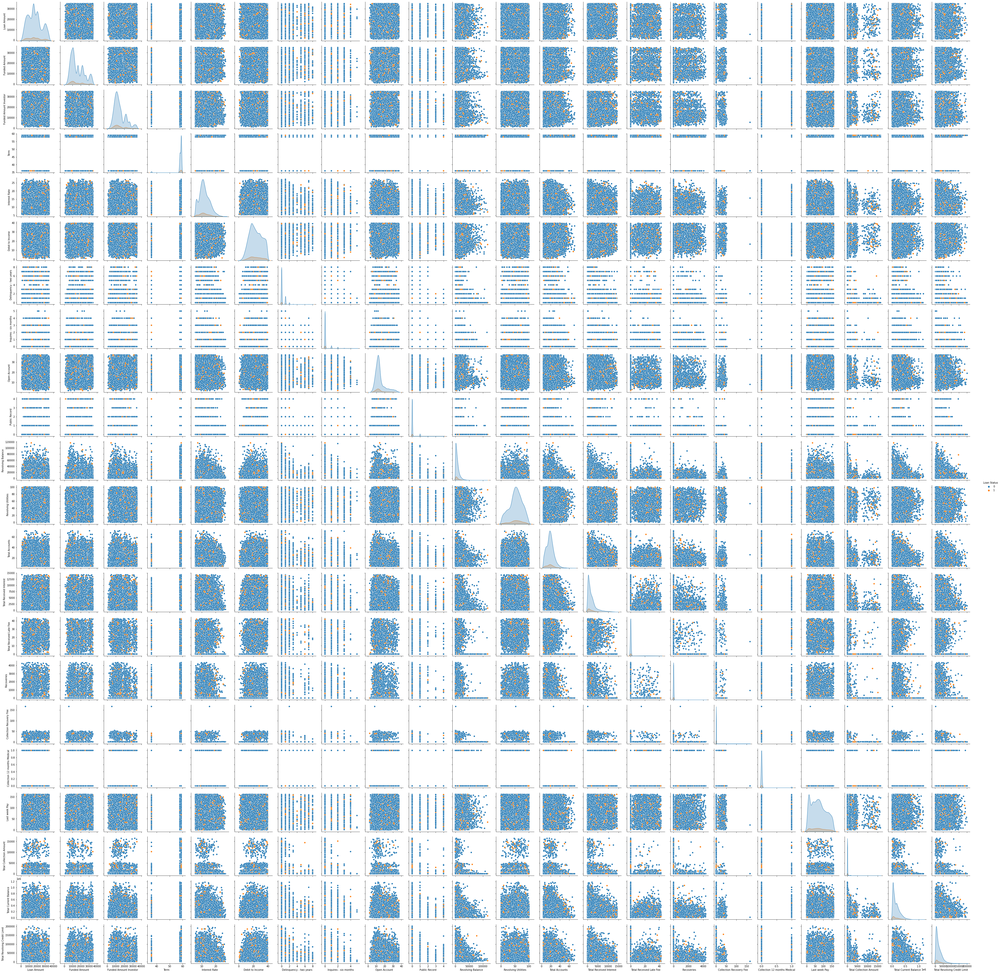

In [236]:
import seaborn as sns
sns.pairplot(dfc , diag_kind = 'kde', hue = "Loan Status")

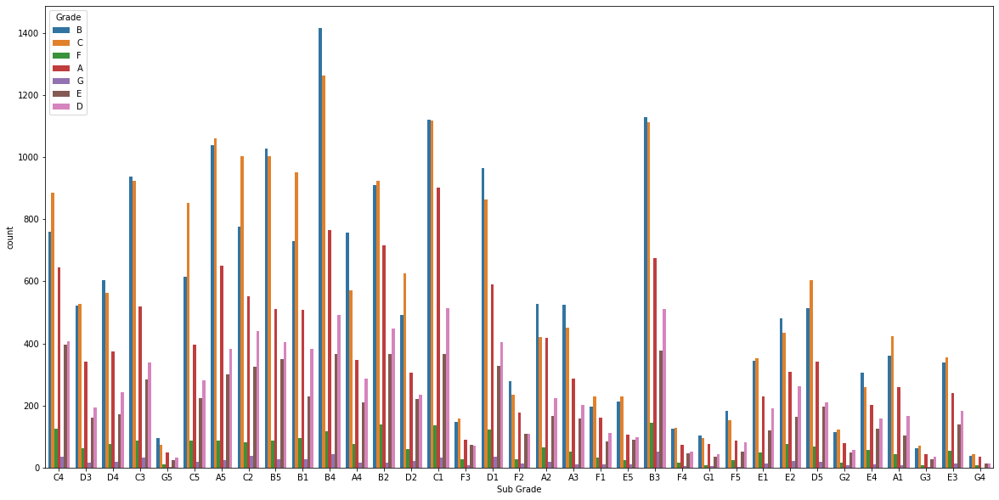

In [19]:
fig, ax = plt.subplots(figsize=(20,10))
sns.countplot(data=dfc, x="Sub Grade", hue="Grade")
plt.show()

c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Loan Amount', ylabel='Loan Status'>

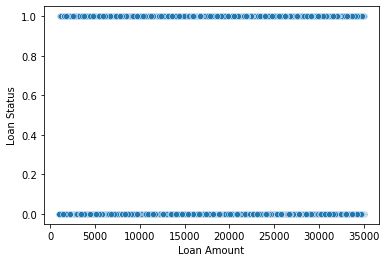

In [19]:
sns.scatterplot(dfc['Loan Amount'], dfc['Loan Status'])

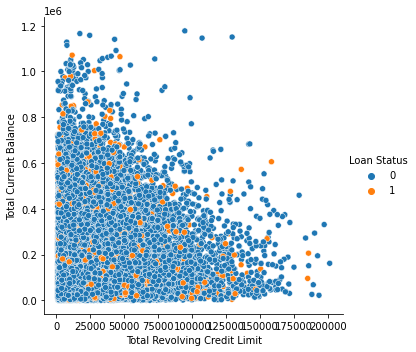

In [235]:
sns.relplot(x="Total Revolving Credit Limit", y="Total Current Balance", hue="Loan Status", data=dfc);

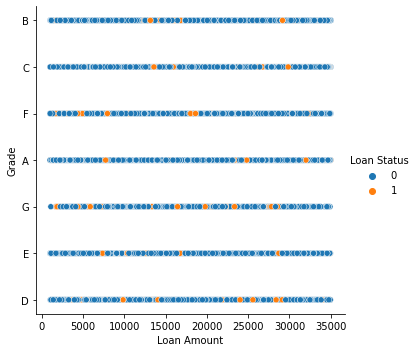

In [20]:
sns.relplot(x="Loan Amount", y="Grade", hue="Loan Status", data=dfc);

c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Loan Status', ylabel='Loan Amount'>

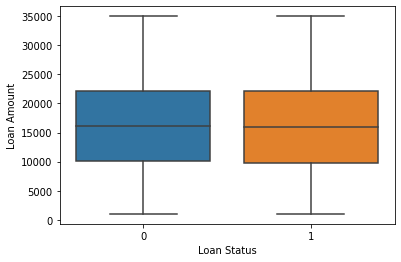

In [21]:
sns.boxplot(dfc["Loan Status"], dfc["Loan Amount"])

c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Loan Status', ylabel='Interest Rate'>

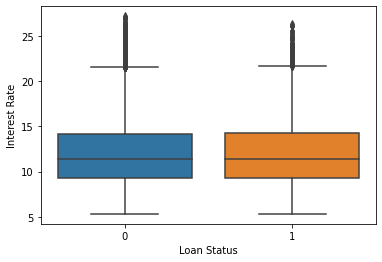

In [22]:
sns.boxplot(dfc["Loan Status"], dfc["Interest Rate"])

In [225]:
corr_matrix = dfc.corr()
corr_matrix

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,...,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
Loan Amount,1.000000,-0.000551,0.002831,0.004277,-0.004888,0.007959,-0.000469,0.008962,0.009088,-0.002542,...,-0.001887,-0.000034,-0.001606,-0.002142,-0.002726,-0.002362,-0.004135,-0.008285,0.002289,-0.004473
Funded Amount,-0.000551,1.000000,0.010227,-0.001503,0.002310,0.002347,0.011313,-0.001587,0.005755,0.003750,...,0.002759,0.001542,0.000462,0.000175,0.001071,-0.003476,-0.002821,-0.001499,0.006145,0.001364
Funded Amount Investor,0.002831,0.010227,1.000000,-0.008943,-0.001917,0.000112,0.001925,-0.003073,-0.007850,0.005002,...,0.001432,-0.000232,0.000966,-0.007272,0.001814,0.004248,0.006862,0.003283,0.005669,-0.000091
Term,0.004277,-0.001503,-0.008943,1.000000,-0.012688,0.001026,-0.004494,-0.005272,0.021362,-0.002827,...,0.008663,-0.000736,-0.003475,-0.001203,-0.003263,0.007035,0.000358,0.003361,-0.005068,-0.003410
Interest Rate,-0.004888,0.002310,-0.001917,-0.012688,1.000000,-0.011203,0.004045,0.009172,-0.003250,0.006979,...,0.006998,0.003119,0.009348,0.001281,-0.009895,-0.012652,0.002771,-0.002567,0.016651,0.002900
Debit to Income,0.007959,0.002347,0.000112,0.001026,-0.011203,1.000000,-0.004007,0.002246,0.001100,-0.007813,...,0.006504,-0.010224,-0.009693,0.002200,-0.000716,0.008639,0.001555,-0.011582,-0.007236,-0.003057
Delinquency - two years,-0.000469,0.011313,0.001925,-0.004494,0.004045,-0.004007,1.000000,0.014679,0.004904,0.006716,...,-0.004511,0.007943,0.017348,0.002707,0.003451,0.001160,0.005642,0.002602,0.009315,0.009990
Inquires - six months,0.008962,-0.001587,-0.003073,-0.005272,0.009172,0.002246,0.014679,1.000000,-0.002109,0.004087,...,0.009556,0.008296,0.012487,0.008388,-0.004436,-0.004453,-0.002210,0.001531,0.004678,0.000578
Open Account,0.009088,0.005755,-0.007850,0.021362,-0.003250,0.001100,0.004904,-0.002109,1.000000,-0.010762,...,0.012980,0.000828,-0.001216,-0.006832,0.003397,-0.013415,-0.006176,-0.007470,0.003096,-0.007073
Public Record,-0.002542,0.003750,0.005002,-0.002827,0.006979,-0.007813,0.006716,0.004087,-0.010762,1.000000,...,0.001283,0.016594,0.008905,0.004725,0.008878,0.004281,0.012928,0.003935,0.012046,0.010590


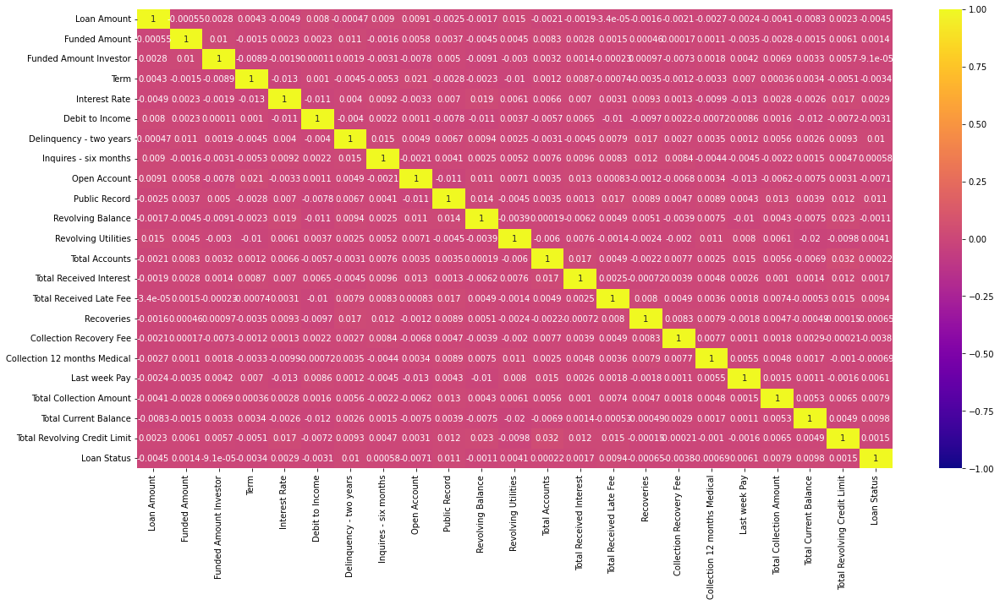

In [226]:
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(corr_matrix,annot=True,cmap='plasma',vmin=-1,vmax=1)
plt.show()

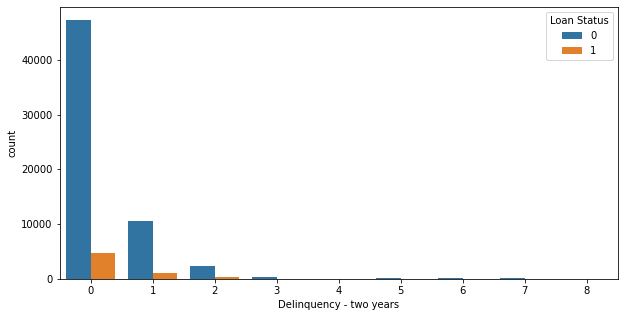

In [234]:
fig, ax = plt.subplots(figsize=(10,5))
sns.countplot(data=dfc, x='Delinquency - two years', hue="Loan Status")
plt.show()

### Categorical Feature analysis

In [23]:
cat_columns = list(dfc.select_dtypes(['object']).columns)

In [24]:
cat_columns

['Batch Enrolled',
 'Grade',
 'Sub Grade',
 'Verification Status',
 'Loan Title',
 'Initial List Status',
 'Application Type']

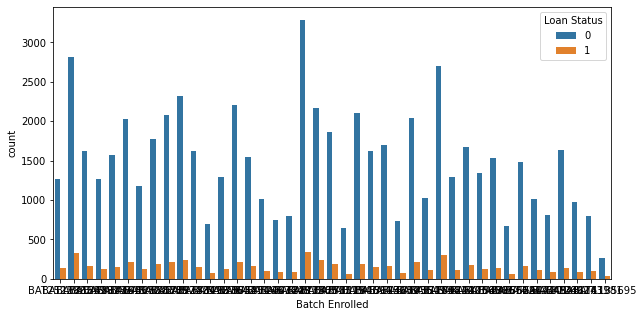

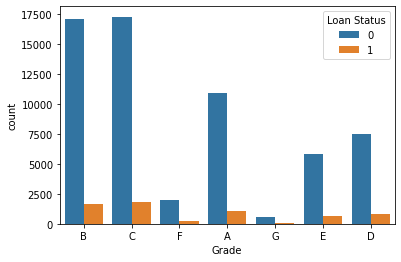

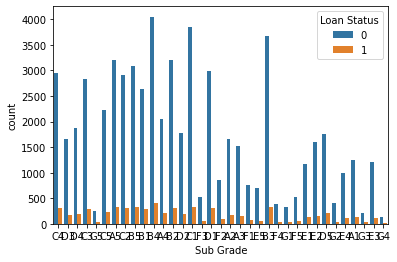

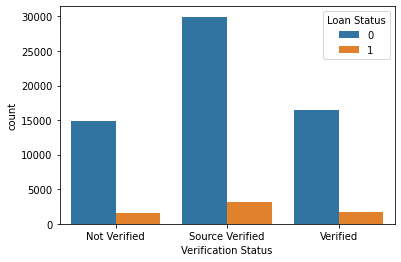

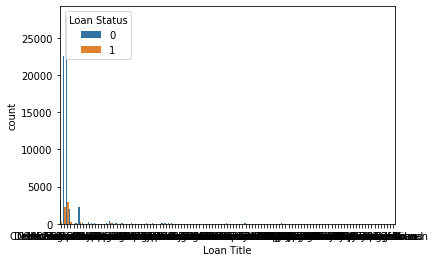

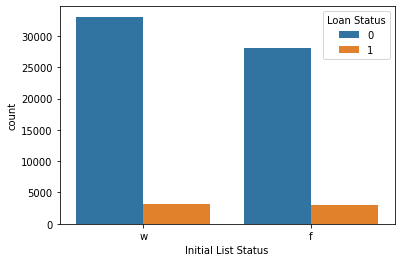

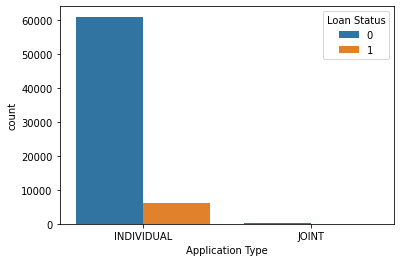

In [261]:
fig, ax = plt.subplots(figsize=(10,5))
for col in cat_columns:
    sns.countplot(data=dfc, x=col, hue="Loan Status")
    plt.show()

#### Deliquency has low correlation but loan defaulters are more present in those who have exhibited no or less deliquency than those who have done more.
#### From all multivariate analysis, the pairplot and heatmap we can observe there is low corellation of most numerical features with the target class
#### Most of the customers had individual application type and there too lie most of the defaulters, whereas those that did not have verified accounts had lesser number of defaulters

<AxesSubplot:ylabel='Loan Status'>

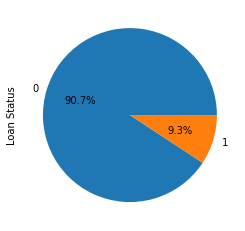

In [25]:
dfc['Loan Status'].value_counts().plot(kind='pie',autopct='%1.1f%%')

In [26]:
dfc['Loan Status'].value_counts()

0    61222
1     6241
Name: Loan Status, dtype: int64

### The Target class is highly imbalanced. There are only 9.3% loan defaulters out of >67000 customers, 6241 in number.

In [27]:
X = dfc.drop('Loan Status',axis=1)
y = dfc['Loan Status']

In [29]:
X = pd.get_dummies(X,drop_first=True)
X.head(2)

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,...,Loan Title_home improvement,Loan Title_loan1,Loan Title_pay off bills,Loan Title_payoff,Loan Title_personal,Loan Title_refi,Loan Title_relief,Loan Title_vacation,Initial List Status_w,Application Type_JOINT
0,10000,32236,12329.36286,59,11.135007,16.284758,1,0,13,0,...,0,0,0,0,0,0,0,0,1,0
1,3609,11940,12191.99692,59,12.237563,15.412409,0,0,12,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy=0.65)
X_res,y_res = smote.fit_resample(X,y)

<AxesSubplot:ylabel='Loan Status'>

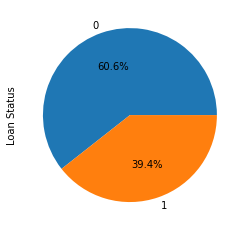

In [31]:
y_res.value_counts().plot(kind='pie',autopct='%1.1f%%')

In [32]:
# Train and test split for balanced data
X_train, X_test, y_train, y_test = train_test_split(X_res,y_res, test_size=0.30, random_state=42)

print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(70711, 214) (30305, 214)
(70711,) (30305,)


In [47]:
# Train and test split for unbalanced original data
bX_train, bX_test, by_train, by_test = train_test_split(X,y, test_size=0.30, random_state=42)

print(bX_train.shape,bX_test.shape)
print(by_train.shape,by_test.shape)

(47224, 214) (20239, 214)
(47224,) (20239,)


# Base model using original imbalanced data

In [48]:
from sklearn.ensemble import RandomForestClassifier

In [54]:
rf1 = RandomForestClassifier()
rf1.fit(bX_train,by_train)

## Prediction on original test data
rf1_base = rf1.predict(bX_test)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(rf1_base,by_test))
print("Recall:",metrics.recall_score(rf1_base,by_test))
print("Confusion Matrix:\n",metrics.classification_report(rf1_base,by_test))

Accuracy: 0.9084440930876031
Recall: 0.0
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.91      0.95     20239
           1       0.00      0.00      0.00         0

    accuracy                           0.91     20239
   macro avg       0.50      0.45      0.48     20239
weighted avg       1.00      0.91      0.95     20239



c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shau

#### Even though there is very good accuracy (~90%), the target class is highly imbalanced and hence predictions will be biased to the majority class.
#### Precision, recall and f1 score are good for majority class 0, but they are 0 for minority class 1 which is bad.
#### Therefore, due to the imbalanced dataset we have to consider recall score and hence used the oversampled dataset that is balanced.

# Using balanced data
## Random Forest Classifier

In [55]:
rf1.fit(X_train,y_train)

## Prediction on balanced test data
rf1_bal = rf1.predict(X_test)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(rf1_bal,y_test))
print("Recall:",metrics.recall_score(rf1_bal,y_test))
print("Confusion Matrix:\n",metrics.classification_report(rf1_bal,y_test))

Accuracy: 0.9189902656327339
Recall: 0.9925537493445202
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.89      0.94     20770
           1       0.80      0.99      0.89      9535

    accuracy                           0.92     30305
   macro avg       0.90      0.94      0.91     30305
weighted avg       0.93      0.92      0.92     30305



#### We can see that the accuracy has slightly increased but the more important thing is we have very good precision, recall and f1 score for both classes after using balanced dataset

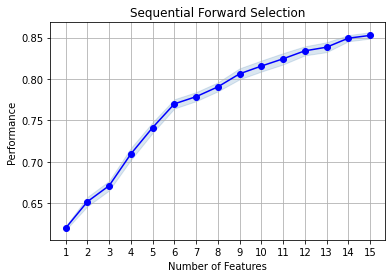

In [38]:
# Build step forward feature selection
sfs1 = sfs(rf1, k_features=15, forward=True, cv=15)
# Perform SFFS
sfs1 = sfs1.fit(X_train, y_train)
sfs2=sfs1.get_metric_dict()
sfs2 = pd.DataFrame.from_dict(sfs2)

fig = plot_sfs(sfs2)

plt.title('Sequential Forward Selection')
plt.grid()
plt.show()

In [40]:
# Which features?
columnList = list(X)
feat_cols = list(sfs1.k_feature_idx_)
print(feat_cols)

[3, 62, 63, 64, 65, 66, 77, 102, 103, 141, 145, 152, 163, 178, 212]


In [41]:
subsetColumnList = [columnList[i] for i in feat_cols] 
print(subsetColumnList)

['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F', 'Sub Grade_C1', 'Verification Status_Source Verified', 'Verification Status_Verified', 'Loan Title_Credit card refinancing', 'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation', 'Loan Title_Home improvement', 'Loan Title_Other', 'Initial List Status_w']


In [44]:
## Building a simple random forest classifier as a base model using balanced data.
rf2 = RandomForestClassifier()
rf2.fit(X_train,y_train)

## Prediction on original test data
rf2_base = rf2.predict(X_test)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(rf2_base,y_test))
print("Recall:",metrics.recall_score(rf2_base,y_test))
print("Confusion Matrix:\n",metrics.classification_report(rf2_base,y_test))

Accuracy: 0.917736347137436
Recall: 0.9925239549331368
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.88      0.94     20808
           1       0.80      0.99      0.88      9497

    accuracy                           0.92     30305
   macro avg       0.90      0.94      0.91     30305
weighted avg       0.93      0.92      0.92     30305



In [45]:
X_train_new=pd.DataFrame(X_train[subsetColumnList])
X_test_new=pd.DataFrame(X_test[subsetColumnList])

In [46]:
X_train_new.shape

(70711, 15)

In [47]:
col_trans = ColumnTransformer([
    ('ss', StandardScaler(), X_train_new.columns)])

In [48]:
# Building a pipeline
pipeline = Pipeline([ ('preprocessor',col_trans),  # Scaling the data
    ('algo',RandomForestClassifier(random_state=0, n_jobs=-1))
])

In [49]:
col_trans.fit(X_train_new)

ColumnTransformer(transformers=[('ss', StandardScaler(),
                                 Index(['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F',
       'Sub Grade_C1', 'Verification Status_Source Verified',
       'Verification Status_Verified', 'Loan Title_Credit card refinancing',
       'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation',
       'Loan Title_Home improvement', 'Loan Title_Other',
       'Initial List Status_w'],
      dtype='object'))])

In [50]:
### Parameters to tune.
param_rf = [{'algo__n_estimators':[100, 200, 500, 1000],
            'algo__max_depth':[7,9, 13,15,19,23,25]}]

In [51]:
# Create an instance of GridSearchCV as model
grid_cv = GridSearchCV(pipeline,param_rf,cv=5,n_jobs=-1,verbose=1)

#learning
grid_cv.fit(X_train_new,y_train)

# print best hyperparameters from shared set of parameters
print("Best Hyper Parameters:\n",grid_cv.best_params_)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
Best Hyper Parameters:
 {'algo__max_depth': 15, 'algo__n_estimators': 1000}


In [52]:
#evaluation(Confusion Matrix)
prediction_GS = grid_cv.predict(X_test_new)
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction_GS,y_test))

Confusion Matrix:
 [[17010  3114]
 [ 1447  8734]]


In [53]:
from sklearn.ensemble import RandomForestClassifier
# Building a pipeline and passing the transformer and the classfier
# Building a pipeline
pipeline_rf = Pipeline([
    ('preprocessor',col_trans),
    ('algo',RandomForestClassifier(max_depth= 13, n_estimators= 100,random_state=0, n_jobs=-1))
])

In [54]:
## Fitting the pipeline on the train data.
pipeline_rf.fit(X_train_new,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ss', StandardScaler(),
                                                  Index(['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F',
       'Sub Grade_C1', 'Verification Status_Source Verified',
       'Verification Status_Verified', 'Loan Title_Credit card refinancing',
       'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation',
       'Loan Title_Home improvement', 'Loan Title_Other',
       'Initial List Status_w'],
      dtype='object'))])),
                ('algo',
                 RandomForestClassifier(max_depth=13, n_jobs=-1,
                                        random_state=0))])

In [55]:
## Prediction on test data
prediction_rf = pipeline_rf.predict(X_test_new)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(prediction_rf,y_test))
print("Recall:",metrics.recall_score(prediction_rf,y_test))
print("Confusion Matrix:\n",metrics.classification_report(prediction_rf,y_test))

Accuracy: 0.8494637848539844
Recall: 0.8576477518162183
Confusion Matrix:
               precision    recall  f1-score   support

           0       0.92      0.85      0.88     20119
           1       0.74      0.86      0.79     10186

    accuracy                           0.85     30305
   macro avg       0.83      0.85      0.84     30305
weighted avg       0.86      0.85      0.85     30305



## Decision Tree Classifier

In [56]:
## Building a simple Decision Tree classifier as a base model using balanced data.
dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)

## Prediction on original test data
og_prediction_dt = dt.predict(X_test)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(og_prediction_dt,y_test))
print("Recall:",metrics.recall_score(og_prediction_dt,y_test))
print("Confusion Matrix:\n",metrics.classification_report(og_prediction_dt,y_test))

Accuracy: 0.8305230160039597
Recall: 0.766264677880038
Confusion Matrix:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86     17701
           1       0.82      0.77      0.79     12604

    accuracy                           0.83     30305
   macro avg       0.83      0.82      0.82     30305
weighted avg       0.83      0.83      0.83     30305



In [ ]:
# Build step forward feature selection
sfs1 = sfs(dt, k_features=15, forward=False, cv=15)
# Perform SFFS
sfs1 = sfs1.fit(X_train, y_train)
sfs2=sfs1.get_metric_dict()
sfs2 = pd.DataFrame.from_dict(sfs2)

fig = plot_sfs(sfs2)

plt.title('Backward Feature Elimination')
plt.grid()
plt.show()

# Important note
I could not run this code on my machine, i tried multiple times. Every day i had let it stay for night but even after 12 hours it would not work. On 2 separate weekends even after 24 hours it did not work. My machine slowed down considerably. Hence, i decided to use the same column subset as earlier found by random forest classifier.

In [33]:
subsetColumnList = ['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F', 'Sub Grade_C1', 'Verification Status_Source Verified', 'Verification Status_Verified', 'Loan Title_Credit card refinancing', 'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation', 'Loan Title_Home improvement', 'Loan Title_Other', 'Initial List Status_w']

In [34]:
print(subsetColumnList)

['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F', 'Sub Grade_C1', 'Verification Status_Source Verified', 'Verification Status_Verified', 'Loan Title_Credit card refinancing', 'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation', 'Loan Title_Home improvement', 'Loan Title_Other', 'Initial List Status_w']


In [35]:
X_train_new_dt=pd.DataFrame(X_train[subsetColumnList])
X_test_new_dt=pd.DataFrame(X_test[subsetColumnList])

In [36]:
X_train_new_dt.shape

(70711, 15)

In [37]:
col_trans = ColumnTransformer([
    ('ss', StandardScaler(), X_train_new_dt.columns)])

In [38]:
# Building a pipeline
pipeline = Pipeline([ ('preprocessor',col_trans),  # Scaling the data
    ('algo',DecisionTreeClassifier())
])

In [40]:
col_trans.fit(X_train_new_dt)

ColumnTransformer(transformers=[('ss', StandardScaler(),
                                 Index(['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F',
       'Sub Grade_C1', 'Verification Status_Source Verified',
       'Verification Status_Verified', 'Loan Title_Credit card refinancing',
       'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation',
       'Loan Title_Home improvement', 'Loan Title_Other',
       'Initial List Status_w'],
      dtype='object'))])

In [41]:
### Parameters to tune.
param_rf = [{'algo__criterion':['gini', 'entropy'],
            'algo__max_depth':(7,25)}]

In [42]:
# Create an instance of RandomizedSearchCV as model
random_cv = RandomizedSearchCV(pipeline,param_rf,cv=5,n_jobs=-1,verbose=1)

#learning
random_cv.fit(X_train_new_dt,y_train)

# print best hyperparameters from shared set of parameters
print("Best Hyper Parameters:\n",random_cv.best_params_)

c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\model_selection\_search.py:306: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best Hyper Parameters:
 {'algo__max_depth': 25, 'algo__criterion': 'entropy'}


In [43]:
#evaluation(Confusion Matrix)
prediction_RS = random_cv.predict(X_test_new_dt)
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction_RS,y_test))

Confusion Matrix:
 [[17068  3083]
 [ 1389  8765]]


In [44]:
pipeline_dt = Pipeline([
    ('preprocessor',col_trans),
    ('algo',DecisionTreeClassifier(max_depth= 25, criterion= 'entropy',random_state=0))
])

In [45]:
## Fitting the pipeline on the train data.
pipeline_dt.fit(X_train_new_dt,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ss', StandardScaler(),
                                                  Index(['Term', 'Grade_B', 'Grade_C', 'Grade_D', 'Grade_E', 'Grade_F',
       'Sub Grade_C1', 'Verification Status_Source Verified',
       'Verification Status_Verified', 'Loan Title_Credit card refinancing',
       'Loan Title_Debt Consolidation', 'Loan Title_Debt consolidation',
       'Loan Title_Home improvement', 'Loan Title_Other',
       'Initial List Status_w'],
      dtype='object'))])),
                ('algo',
                 DecisionTreeClassifier(criterion='entropy', max_depth=25,
                                        random_state=0))])

In [46]:
## Prediction on test data
prediction_dt = pipeline_dt.predict(X_test_new_dt)

## Computing Accuracy, Recall, and Confusion matrix for test data
print("Accuracy:",metrics.accuracy_score(prediction_dt,y_test))
print("Recall:",metrics.recall_score(prediction_dt,y_test))
print("Confusion Matrix:\n",metrics.classification_report(prediction_dt,y_test))

Accuracy: 0.8524335918165319
Recall: 0.8632066180815442
Confusion Matrix:
               precision    recall  f1-score   support

           0       0.92      0.85      0.88     20151
           1       0.74      0.86      0.80     10154

    accuracy                           0.85     30305
   macro avg       0.83      0.86      0.84     30305
weighted avg       0.86      0.85      0.85     30305



# Conclusion

In [56]:
print('\033[1;46;13m Performance of Base model on Imbalanced Data:\033[0;0m')
print("Accuracy:",metrics.accuracy_score(rf1_base,by_test))
print("Recall:",metrics.recall_score(rf1_base,by_test))
print("Confusion Matrix:\n",metrics.classification_report(rf1_base,by_test))
print('--'*50)

print('\033[1;46;13m Performance of Random Forest Algorithm on Balanced Data:\033[0;0m')
print("Accuracy:",metrics.accuracy_score(rf1_bal,y_test))
print("Recall:",metrics.recall_score(rf1_bal,y_test))
print("Confusion Matrix:\n",metrics.classification_report(rf1_bal,y_test))
print('--'*50)

 Performance of Base model on Imbalanced Data:
Accuracy: 0.9084440930876031
Recall: 0.0
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.91      0.95     20239
           1       0.00      0.00      0.00         0

    accuracy                           0.91     20239
   macro avg       0.50      0.45      0.48     20239
weighted avg       1.00      0.91      0.95     20239

----------------------------------------------------------------------------------------------------
 Performance of Random Forest Algorithm on Balanced Data:
Accuracy: 0.9189902656327339
Recall: 0.9925537493445202
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.89      0.94     20770
           1       0.80      0.99      0.89      9535

    accuracy                           0.92     30305
   macro avg       0.90      0.94      0.91     30305
weighted avg       0.93      0.92      0.92     30305

-----

c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shaur\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\shau

From the above comparison of results of base model with unbalanced data and and tuned model with balanced data, we can conclude that without handling imbalanced data, we had a recall score of zero, but after we handled the imbalanced data we got a higher recall score of 99% for Random Forest and 76% for Decision Tree algorithms. When we selected best K features and tuned hyperparameters, we got more than 85% recall scores for both classifiers.

- First we have balanced our imbalanced data using Oversampling approach.
- We had 214 features in the balanced dataset. Out of 214 features we selected K=15 as the best features based on the feature importance. The decision to use this number was due to low computational power in my machine.
- Then we tuned the hyperparameters for the Random Forest Classifier using the GridSearchCV with 5folds on the K best features.(the best combination of hyperparameters were 'max_depth': 15, 'n_estimators': 1000}).
- We also tuned the hyperparameters for the Decision Tree Classifier using the RandomozedSearchCV with 5folds on the K best features.(the best combination of hyperparameters were 'max_depth': 25, 'criterion': 'entropy'}).
- We have built a pipeline, where when we pass the train data with best features, it will first scale the data, and then fit the RF and DT model with tuned parameters.
- From the both models that we have built we would prefer Random Forest algorithm over the Decision Tree Classifier based on the algorithm performance on the data.

In this notebook, we have tried only a single approch when comes to balancing the data, one method of feature selection(as the backward selection could not be tried out), and have implemented two models for model selection and performed respective hyperparameter tuning. Further, we can try out different data balancing approach, feature selection, and different models and hyperparameters to get best results.

### Also it can be noted even though some amount of overfitting is occuring without selecting k best features, the metrics like precision, recall, and f1 score are highest as due to low computational power I was not able to play around with the k best features value and started with 15 and stuck with it. 
#### It can be observed that tuning the model does prevent some amount of overfitting even if accuracy and recall is lower. In the future we can choose a different method of encoding to reduce features and then select optimum number of features. I tried label encoding and doing the sequential forward selection but it still took longer than 14 hours, hence I stopped the process and kept the older code.

- Another observation made was the Loan Title class could be cleaned up/grouped for further refining of features due to which one hot encoding resulted in curse of dimensionality